<a href="https://colab.research.google.com/github/cagkangrsy/basketball-ai-highlight-generator/blob/main/basketball_detect_track_and_stylize_single_player_highlight.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 🏀 Basketball AI: Detect, Track, and Stylize Single Player Highlights

This notebook is inspired by and based on the work by **Roboflow** in  
their tutorial [**How to Detect, Track, and Identify Basketball Players with Computer Vision**](https://blog.roboflow.com/identify-basketball-players/).

> **Note:** Several of the initial steps such as player detection, SAM-based segmentation, and tracking setup follow or reuse parts of their approach. The logic is clearly explained in Roboflow’s tutorial and is therefore not repeated in detail here.


In [ ]:
import os
from google.colab import userdata

os.environ["HF_TOKEN"] = userdata.get("HF_TOKEN")
os.environ["ROBOFLOW_API_KEY"] = userdata.get("ROBOFLOW_API_KEY")

In [ ]:
!nvidia-smi

Thu Oct 16 11:25:01 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   40C    P8              9W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [ ]:
from pathlib import Path

HOME = Path.cwd()
print("HOME:", HOME)

HOME: /content


In [ ]:
!git clone https://github.com/Gy920/segment-anything-2-real-time.git
%cd {HOME}/segment-anything-2-real-time
!pip install -e . -q
!python setup.py build_ext --inplace

Cloning into 'segment-anything-2-real-time'...
remote: Enumerating objects: 406, done.
remote: Counting objects: 100% (93/93), done.
remote: Compressing objects: 100% (37/37), done.
remote: Total 406 (delta 65), reused 56 (delta 56), pack-reused 313 (from 2)
Receiving objects: 100% (406/406), 79.43 MiB | 30.36 MiB/s, done.
Resolving deltas: 100% (91/91), done.
/content/segment-anything-2-real-time
  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build editable ... done
  Preparing editable metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 2.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 7.7 MB/s eta 0:00:00
  Building editable for SAM-2 (pyproject.toml) ... done
running build_ext
W1016 10:07:45.960000 2110 torch/utils/cpp_extension.py:615] Attempted to use ninja as the BuildExtension backend bu

In [ ]:
!(cd checkpoints && bash download_ckpts.sh)

--2025-10-16 10:10:54--  https://dl.fbaipublicfiles.com/segment_anything_2/092824/sam2.1_hiera_tiny.pt
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 99.84.41.79, 99.84.41.33, 99.84.41.80, ...
Connecting to dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)|99.84.41.79|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 156008466 (149M) [application/vnd.snesdev-page-table]
Saving to: ‘sam2.1_hiera_tiny.pt’

sam2.1_hiera_tiny.p 100%[===================>] 148.78M   282MB/s    in 0.5s    

2025-10-16 10:10:54 (282 MB/s) - ‘sam2.1_hiera_tiny.pt’ saved [156008466/156008466]

--2025-10-16 10:10:54--  https://dl.fbaipublicfiles.com/segment_anything_2/092824/sam2.1_hiera_small.pt
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 99.84.41.79, 99.84.41.33, 99.84.41.80, ...
Connecting to dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)|99.84.41.79|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 184416285 (176M) [application/vnd.

In [ ]:
!pip install -q gdown
!pip install -q inference-gpu
!pip install -q git+https://github.com/roboflow/supervision.git

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 105.7/105.7 kB 7.1 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 91.2/91.2 kB 9.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.4/99.4 kB 10.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.5/2.5 MB 51.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 190.1/190.1 kB 14.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.9/75.9 kB 6.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 54.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 93.2/93.2 kB 8.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 243.4/243.4 kB 20.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.0/64.0 kB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
SOURCE_VIDEO_DIRECTORY = HOME / "videos"
SOURCE_VIDEO_DIRECTORY.mkdir(parents=True, exist_ok=True)

!gdown -q "https://drive.google.com/uc?id=1KRw2EPgDTBP2S4fIbzbJ1Y64I-oavG8U" -O {SOURCE_VIDEO_DIRECTORY}/

In [ ]:
!ls -la {VIDEO_DIRECTORY}

ls: cannot access '{VIDEO_DIRECTORY}': No such file or directory


In [ ]:
SOURCE_VIDEO_PATH = SOURCE_VIDEO_DIRECTORY / "kyrie.mp4"

In [ ]:
from IPython.display import Video
from typing import Dict, List, Optional, Union, Iterable, Tuple
from operator import itemgetter

import cv2
import numpy as np
import torch
from tqdm import tqdm

import supervision as sv
from inference import get_model

ModelDependencyMissing: Your `inference` configuration does not support PaliGemma model. Use pip install 'inference[transformers]' to install missing requirements.To suppress this warning, set PALIGEMMA_ENABLED to False.
ModelDependencyMissing: Your `inference` configuration does not support Florence2 model. Use pip install 'inference[transformers]' to install missing requirements.To suppress this warning, set FLORENCE2_ENABLED to False.
ModelDependencyMissing: Your `inference` configuration does not support Qwen2.5-VL model. Use pip install 'inference[transformers]' to install missing requirements.To suppress this warning, set QWEN_2_5_ENABLED to False.
ModelDependencyMissing: Your `inference` configuration does not support SAM model. Use pip install 'inference[sam]' to install missing requirements.To suppress this warning, set CORE_MODEL_SAM_ENABLED to False.
ModelDependencyMissing: Your `inference` configuration does not support CLIP model. Use pip install 'inference[clip]' to insta

In [ ]:
PLAYER_DETECTION_MODEL_ID = "basketball-player-detection-3-ycjdo/4"
PLAYER_DETECTION_MODEL_CONFIDENCE = 0.4
PLAYER_DETECTION_MODEL_IOU_THRESHOLD = 0.9
PLAYER_DETECTION_MODEL = get_model(model_id=PLAYER_DETECTION_MODEL_ID)

COLOR = sv.ColorPalette.from_hex([
    "#ffff00", "#ff9b00", "#ff66ff", "#3399ff", "#ff66b2", "#ff8080",
    "#b266ff", "#9999ff", "#66ffff", "#33ff99", "#66ff66", "#99ff00"
])

Detections(xyxy=array([[1225.,  474., 1420.,  717.],
       [ 438.,  507.,  538.,  792.],
       [ 771.,  328.,  871.,  578.],
       [ 956.,  307., 1056.,  532.],
       [ 624.,  283.,  722.,  521.],
       [1127.,  496., 1272.,  763.],
       [1465.,  503., 1580.,  750.],
       [ 541.,  661.,  646.,  851.],
       [1776.,  309., 1845.,  528.],
       [ 130.,  284.,  226.,  504.],
       [ 968.,  507., 1164.,  749.],
       [ 234.,  595.,  383.,  855.],
       [1306.,  538., 1333.,  566.],
       [1528.,  690., 1567.,  726.],
       [ 289.,  216.,  355.,  235.],
       [ 484.,  573.,  509.,  604.],
       [ 991.,  361., 1020.,  388.]]), mask=None, confidence=array([0.93567711, 0.93467134, 0.91654527, 0.91341519, 0.91278028,
       0.90003598, 0.89960867, 0.89159822, 0.88973373, 0.87787187,
       0.87326539, 0.84415168, 0.81924504, 0.80423558, 0.80098373,
       0.77868235, 0.77717745]), class_id=array([3, 3, 3, 3, 3, 3, 3, 8, 8, 8, 3, 3, 2, 0, 9, 2, 2]), tracker_id=None, data={'clas

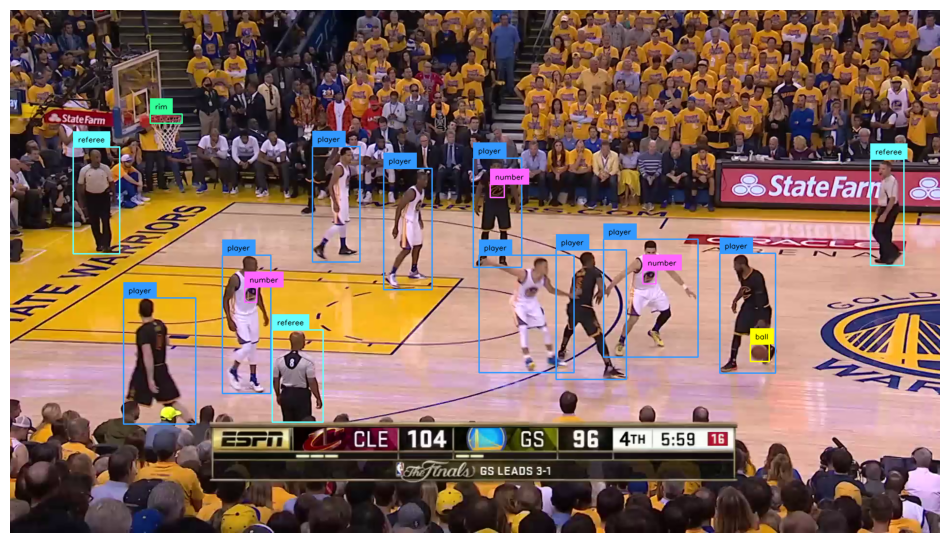

In [ ]:
box_annotator = sv.BoxAnnotator(color=COLOR, thickness=2)
label_annotator = sv.LabelAnnotator(color=COLOR, text_color=sv.Color.BLACK)

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

result = PLAYER_DETECTION_MODEL.infer(frame, confidence=PLAYER_DETECTION_MODEL_CONFIDENCE, iou_threshold=PLAYER_DETECTION_MODEL_IOU_THRESHOLD)[0]
detections = sv.Detections.from_inference(result)
print(detections)

annotated_frame = frame.copy()
annotated_frame = box_annotator.annotate(
    scene=annotated_frame,
    detections=detections)
annotated_frame = label_annotator.annotate(
    scene=annotated_frame,
    detections=detections)

sv.plot_image(annotated_frame)

In [ ]:
PLAYER_CLASS_IDS = [0, 3, 4]
# 0-ball, 3-player, 4,player-in-possession

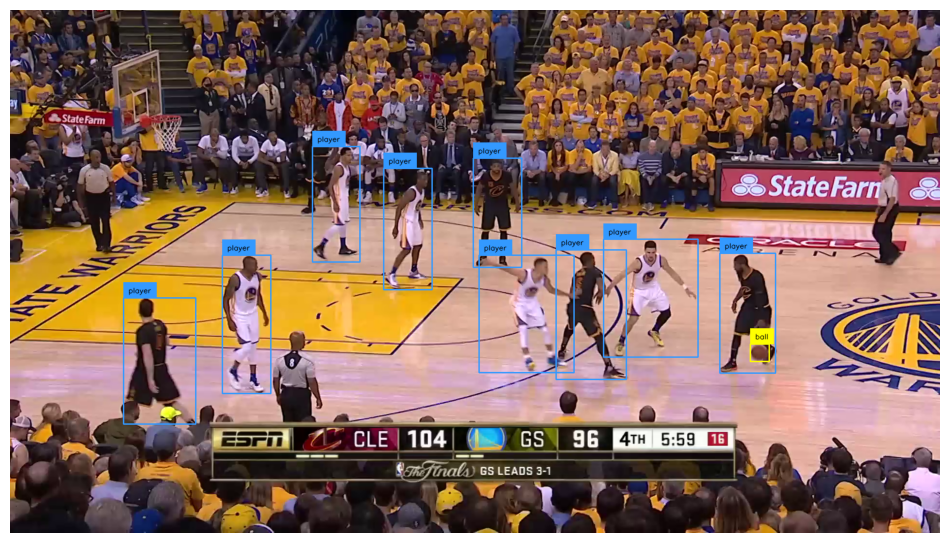

In [ ]:
box_annotator = sv.BoxAnnotator(color=COLOR, thickness=2)
label_annotator = sv.LabelAnnotator(color=COLOR, text_color=sv.Color.BLACK)

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

result = PLAYER_DETECTION_MODEL.infer(frame, confidence=PLAYER_DETECTION_MODEL_CONFIDENCE, iou_threshold=PLAYER_DETECTION_MODEL_IOU_THRESHOLD)[0]
detections = sv.Detections.from_inference(result)
detections = detections[np.isin(detections.class_id, PLAYER_CLASS_IDS)]

annotated_frame = frame.copy()
annotated_frame = box_annotator.annotate(
    scene=annotated_frame,
    detections=detections)
annotated_frame = label_annotator.annotate(
    scene=annotated_frame,
    detections=detections)

sv.plot_image(annotated_frame)

In [ ]:
TARGET_VIDEO_PATH = HOME / f"{SOURCE_VIDEO_PATH.stem}-detection{SOURCE_VIDEO_PATH.suffix}"
TARGET_VIDEO_COMPRESSED_PATH = HOME / f"{TARGET_VIDEO_PATH.stem}-detection{TARGET_VIDEO_PATH.suffix}"

box_annotator = sv.BoxAnnotator(color=COLOR, thickness=2)
label_annotator = sv.LabelAnnotator(color=COLOR, text_color=sv.Color.BLACK)

def callback(frame: np.ndarray, index: int) -> np.ndarray:
    result = PLAYER_DETECTION_MODEL.infer(frame, confidence=PLAYER_DETECTION_MODEL_CONFIDENCE, iou_threshold=PLAYER_DETECTION_MODEL_IOU_THRESHOLD)[0]
    detections = sv.Detections.from_inference(result)

    annotated_frame = frame.copy()
    annotated_frame = box_annotator.annotate(
        scene=annotated_frame,
        detections=detections)
    annotated_frame = label_annotator.annotate(
        scene=annotated_frame,
        detections=detections)
    return annotated_frame

sv.process_video(
    source_path=SOURCE_VIDEO_PATH,
    target_path=TARGET_VIDEO_PATH,
    callback=callback,
    show_progress=True
)

!ffmpeg -y -loglevel error -i {TARGET_VIDEO_PATH} -vcodec libx264 -crf 28 {TARGET_VIDEO_COMPRESSED_PATH}

Processing video:   0%|          | 0/271 [00:00<?, ?it/s]

In [ ]:
Video(TARGET_VIDEO_COMPRESSED_PATH, embed=True, width=1080)

In [ ]:
%cd $HOME/segment-anything-2-real-time

from sam2.build_sam import build_sam2_camera_predictor

SAM2_CHECKPOINT = "checkpoints/sam2.1_hiera_large.pt"
SAM2_CONFIG = "configs/sam2.1/sam2.1_hiera_l.yaml"

predictor = build_sam2_camera_predictor(SAM2_CONFIG, SAM2_CHECKPOINT)

/content/segment-anything-2-real-time


In [ ]:
def filter_segments_by_distance(mask: np.ndarray, distance_threshold: float = 300) -> np.ndarray:
    """
    Keeps the main segment and removes segments farther than distance_threshold.

    Args:
        mask (np.ndarray): Boolean mask.
        distance_threshold (float): Maximum allowed distance from the main segment.

    Returns:
        np.ndarray: Boolean mask after filtering.
    """
    assert mask.dtype == bool, "Input mask must be boolean."
    mask_uint8 = mask.astype(np.uint8)
    num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(mask_uint8, connectivity=8)
    if num_labels <= 1:
        return mask.copy()
    main_label = 1 + np.argmax(stats[1:, cv2.CC_STAT_AREA])
    main_centroid = centroids[main_label]
    filtered_mask = np.zeros_like(mask, dtype=bool)
    for label in range(1, num_labels):
        centroid = centroids[label]
        dist = np.linalg.norm(centroid - main_centroid)
        if label == main_label or dist <= distance_threshold:
            filtered_mask[labels == label] = True
    return filtered_mask

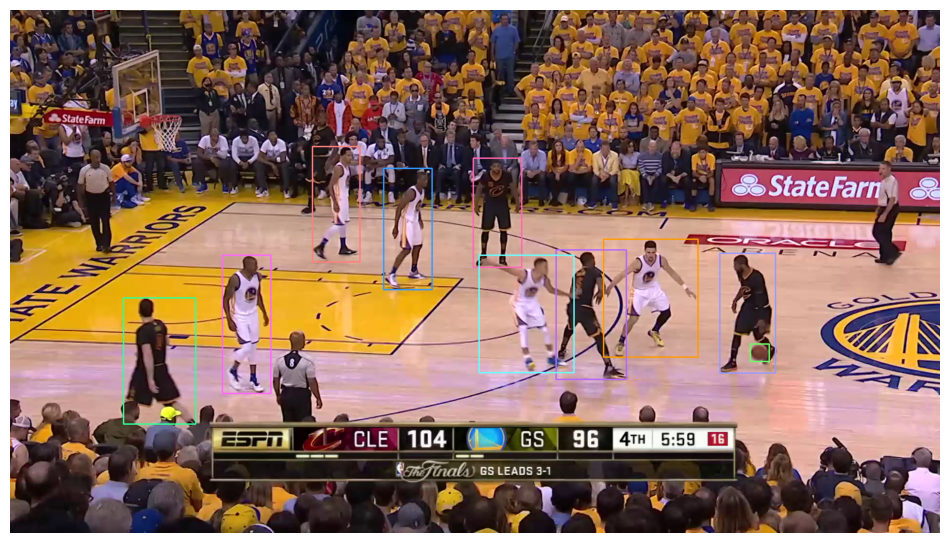

Processing video:   0%|          | 0/271 [00:00<?, ?it/s]

In [ ]:
TARGET_VIDEO_PATH = HOME / f"{SOURCE_VIDEO_PATH.stem}-mask{SOURCE_VIDEO_PATH.suffix}"
TARGET_VIDEO_COMPRESSED_PATH = HOME / f"{TARGET_VIDEO_PATH.stem}-compressed{TARGET_VIDEO_PATH.suffix}"

mask_annotator = sv.MaskAnnotator(
    color=COLOR,
    color_lookup=sv.ColorLookup.TRACK,
    opacity=0.5)
box_annotator = sv.BoxAnnotator(
    color=COLOR,
    color_lookup=sv.ColorLookup.TRACK,
    thickness=2
)

# we use RF-DETR model to aquire future SAM2.1 prompt

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

result = PLAYER_DETECTION_MODEL.infer(frame, confidence=PLAYER_DETECTION_MODEL_CONFIDENCE, iou_threshold=PLAYER_DETECTION_MODEL_IOU_THRESHOLD)[0]
detections = sv.Detections.from_inference(result)
detections = detections[np.isin(detections.class_id, PLAYER_CLASS_IDS)]

# we assign each detection a tracker ID (it must be greater than 0)

TRACKE_ID = list(range(1, len(detections.class_id) + 1))
detections.tracker_id = TRACKE_ID

annotated_frame = frame.copy()
annotated_frame = box_annotator.annotate(scene=annotated_frame, detections=detections)
sv.plot_image(annotated_frame)

# we prompt SAM2.1 using RF-DETR model detections

with torch.inference_mode(), torch.autocast("cuda", dtype=torch.bfloat16):
    predictor.load_first_frame(frame)

    for xyxy, tracker_id in zip(detections.xyxy, detections.tracker_id):
        xyxy = np.array([xyxy])

        _, object_ids, mask_logits = predictor.add_new_prompt(
            frame_idx=0,
            obj_id=tracker_id,
            bbox=xyxy
        )

def callback(frame: np.ndarray, index: int) -> np.ndarray:
    with torch.inference_mode(), torch.autocast("cuda", dtype=torch.bfloat16):
        tracker_ids, mask_logits = predictor.track(frame)
        tracker_ids = np.array(tracker_ids)
        masks = (mask_logits > 0.0).cpu().numpy()
        masks = np.squeeze(masks).astype(bool)

        masks = np.array([
            filter_segments_by_distance(mask, distance_threshold=300)
            for mask
            in masks
        ])

        detections = sv.Detections(
            xyxy=sv.mask_to_xyxy(masks=masks),
            mask=masks,
            tracker_id=tracker_ids
        )

        annotated_frame = frame.copy()
        annotated_frame = mask_annotator.annotate(scene=annotated_frame, detections=detections)
        annotated_frame = box_annotator.annotate(scene=annotated_frame, detections=detections)
        return annotated_frame

sv.process_video(
    source_path=SOURCE_VIDEO_PATH,
    target_path=TARGET_VIDEO_PATH,
    callback=callback,
    show_progress=True
)

!ffmpeg -y -loglevel error -i {TARGET_VIDEO_PATH} -vcodec libx264 -crf 28 {TARGET_VIDEO_COMPRESSED_PATH}

In [ ]:
Video(TARGET_VIDEO_COMPRESSED_PATH, embed=True, width=1080)

In [ ]:
TARGET_VIDEO_PATH = HOME / f"{SOURCE_VIDEO_PATH.stem}--highlight--mask{SOURCE_VIDEO_PATH.suffix}"
TARGET_VIDEO_COMPRESSED_PATH = HOME / f"{TARGET_VIDEO_PATH.stem}--highlight--compressed{TARGET_VIDEO_PATH.suffix}"

# ====== IMPORTS ======
import numpy as np
import cv2
import torch
import supervision as sv
from pathlib import Path
from supervision.detection.utils.converters import mask_to_xyxy as sv_mask_to_xyxy

# ====== CLASSES ======
CLASS = {
    "ball": 0,
    "ball_in_basket": 1,
    "number": 2,
    "player": 3,
    "player_in_possession": 4,
    "player_jump_shot": 5,
    "player_layup_dunk": 6,
    "player_shot_block": 7,
    "referee": 8,
    "rim": 9,
}

# ====== CONFIG / PATHS ======
SELECTED_TRACKER_ID = None  # set once from frame 0

# ====== ANNOTATORS ======
mask_annotator = sv.MaskAnnotator(
    color=COLOR,
    color_lookup=sv.ColorLookup.TRACK,
    opacity=0.5
)
box_annotator = sv.BoxAnnotator(
    color=COLOR,
    color_lookup=sv.ColorLookup.TRACK,
    thickness=2
)
label_annotator = sv.LabelAnnotator(
    color=COLOR,
    color_lookup=sv.ColorLookup.TRACK,
    text_color=sv.Color.BLACK
)

# ---- helpers ----
def _center_xyxy(xyxy):
    x1, y1, x2, y2 = xyxy
    return ((x1 + x2) * 0.5, (y1 + y2) * 0.5)

def _point_in_xyxy(px, py, xyxy):
    x1, y1, x2, y2 = xyxy
    return (px >= x1) and (px <= x2) and (py >= y1) and (py <= y2)

def _squared_dist(p1, p2):
    dx = p1[0] - p2[0]
    dy = p1[1] - p2[1]
    return dx*dx + dy*dy

# ====== FIRST FRAME: detect, assign local tracker IDs, pick EXACT ball holder, prompt SAM ======
frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame0 = next(frame_generator)

# run your detector
result = PLAYER_DETECTION_MODEL.infer(
    frame0,
    confidence=PLAYER_DETECTION_MODEL_CONFIDENCE,
    iou_threshold=PLAYER_DETECTION_MODEL_IOU_THRESHOLD
)[0]
detections = sv.Detections.from_inference(result)

# (optional) you may restrict to classes of interest during prompting
# detections = detections[np.isin(detections.class_id, [CLASS["player"], CLASS["player_in_possession"], CLASS["ball"]])]

# assign simple per-object IDs starting from 1 (these become obj_id for SAM tracker)
TRACKER_IDS = np.arange(1, len(detections.class_id) + 1, dtype=int)
detections.tracker_id = TRACKER_IDS

# ---- choose EXACT holder of the ball ----
cls = detections.class_id
conf = detections.confidence if detections.confidence is not None else np.ones_like(cls, dtype=float)
xyxy = detections.xyxy

pip_idx    = np.where(cls == CLASS["player_in_possession"])[0]
ball_idx   = np.where(cls == CLASS["ball"])[0]
player_idx = np.where(cls == CLASS["player"])[0]

chosen_det_idx = None

# 1) Prefer a 'player_in_possession'
if len(pip_idx) > 0:
    chosen_det_idx = int(pip_idx[np.argmax(conf[pip_idx])])

# 2) Else: strongest ball -> player whose bbox contains the ball center
elif len(ball_idx) > 0 and len(player_idx) > 0:
    b_best = int(ball_idx[np.argmax(conf[ball_idx])])
    bx, by = _center_xyxy(xyxy[b_best])
    containing_players = [i for i in player_idx if _point_in_xyxy(bx, by, xyxy[i])]
    if len(containing_players) > 0:
        # pick tightest box among containers
        areas = [(xyxy[i][2]-xyxy[i][0])*(xyxy[i][3]-xyxy[i][1]) for i in containing_players]
        chosen_det_idx = int(containing_players[int(np.argmin(areas))])
    else:
        # 3) Fallback: nearest player to ball center (thresholded)
        DIST_THRESH2 = 200**2  # tune as needed
        dists = [(_squared_dist(_center_xyxy(xyxy[i]), (bx, by)), i) for i in player_idx]
        dists.sort(key=lambda t: t[0])
        if len(dists) > 0 and dists[0][0] <= DIST_THRESH2:
            chosen_det_idx = int(dists[0][1])

# 4) Final fallback: highest-confidence player
if chosen_det_idx is None and len(player_idx) > 0:
    chosen_det_idx = int(player_idx[np.argmax(conf[player_idx])])

# store the selected id (or leave None)
if chosen_det_idx is not None:
    SELECTED_TRACKER_ID = int(detections.tracker_id[chosen_det_idx])

# ---- Prompt SAM with ALL detections so IDs persist (you can limit to chosen only if preferred) ----
autocast_device = "cuda" if torch.cuda.is_available() else "cpu"
with torch.inference_mode(), torch.autocast(autocast_device, dtype=torch.bfloat16 if autocast_device=="cuda" else torch.float32):
    predictor.load_first_frame(frame0)
    for xyxy_box, tracker_id in zip(detections.xyxy, detections.tracker_id):
        _ = predictor.add_new_prompt(
            frame_idx=0,
            obj_id=int(tracker_id),
            bbox=np.array([xyxy_box])
        )

# ====== CALLBACK: track with SAM, draw ONLY the chosen player's mask + bbox + "HIGHLIGHT PLAYER" ======
def callback(frame: np.ndarray, index: int) -> np.ndarray:
    autocast_device = "cuda" if torch.cuda.is_available() else "cpu"
    with torch.inference_mode(), torch.autocast(autocast_device, dtype=torch.bfloat16 if autocast_device=="cuda" else torch.float32):
        tracker_ids, mask_logits = predictor.track(frame)

    tracker_ids = np.array(tracker_ids)
    masks = (mask_logits > 0.0).cpu().numpy()
    masks = np.squeeze(masks).astype(bool)

    # optional cleanup for spurious fragments
    try:
        masks = np.array([
            filter_segments_by_distance(mask, distance_threshold=300)
            for mask in masks
        ])
    except NameError:
        pass

    # build detections for current frame (only tracker_id + mask/box)
    dets = sv.Detections(
        xyxy=sv_mask_to_xyxy(masks=masks),
        mask=masks,
        tracker_id=tracker_ids
    )

    canvas = frame.copy()

    # Draw ONLY the selected player
    if SELECTED_TRACKER_ID is not None and dets.tracker_id is not None:
        idx = np.where(dets.tracker_id == SELECTED_TRACKER_ID)[0]
        if len(idx) > 0:
            focus = dets[int(idx[0])]  # single-object Detections
            canvas = mask_annotator.annotate(scene=canvas, detections=focus)
            canvas = box_annotator.annotate(scene=canvas, detections=focus)
            canvas = label_annotator.annotate(
                scene=canvas,
                detections=focus,
                labels=["HIGHLIGHT PLAYER"]
            )
    # If lost, do nothing (no graying), just return original frame
    return canvas

# ====== PROCESS & SAVE ======
sv.process_video(
    source_path=SOURCE_VIDEO_PATH,
    target_path=TARGET_VIDEO_PATH,
    callback=callback,
    show_progress=True
)

!ffmpeg -y -loglevel error -i {TARGET_VIDEO_PATH} -vcodec libx264 -crf 28 {TARGET_VIDEO_COMPRESSED_PATH}

Processing video:   0%|          | 0/271 [00:00<?, ?it/s]

OutOfMemoryError: CUDA out of memory. Tried to allocate 5.32 GiB. GPU 0 has a total capacity of 14.74 GiB of which 4.45 GiB is free. Process 217344 has 10.29 GiB memory in use. Of the allocated memory 8.72 GiB is allocated by PyTorch, and 944.38 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)

In [ ]:
!nvidia-smi

Thu Oct 16 11:23:42 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   47C    P0             27W /   70W |   10542MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----